<h1 style="font-size: 1.5em; color: #555555;">Question1) Pick an image of your liking and reconstruct it using matrix factorization. Choose a suitable value for the rank r. Run Gradient Descent until it converges, plot the reconstructed image alongside the original image. Calculate and report the RMSE and PSNR metrics.</h1>


In [334]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [335]:
# Read in a image from torchvision
import torchvision
img = torchvision.io.read_image("beach.jpg")
print(img.shape)


torch.Size([3, 665, 1000])


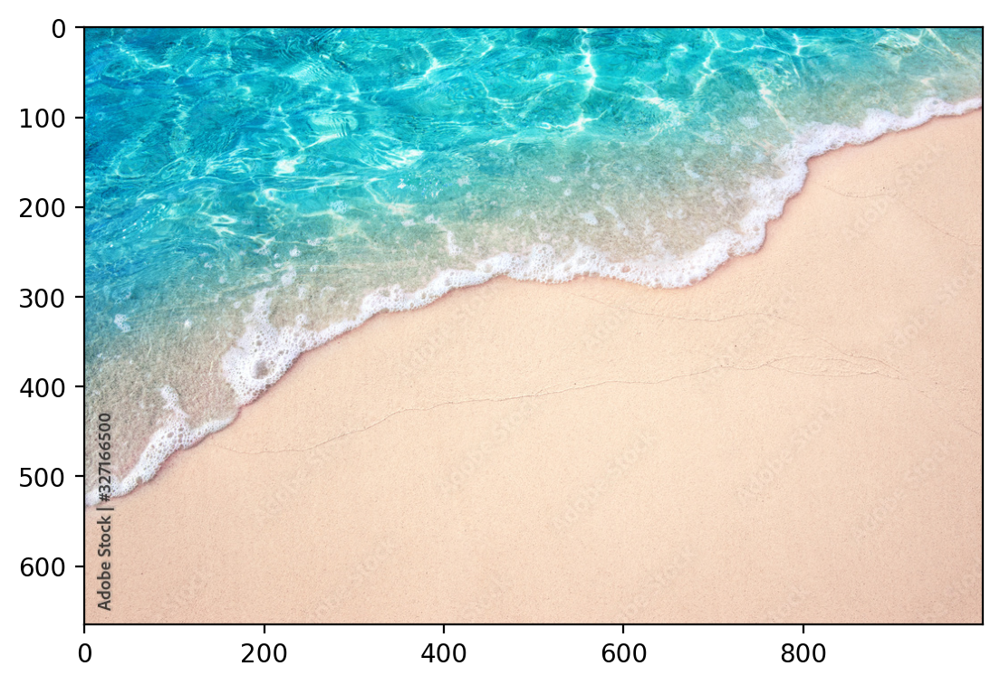

In [336]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [337]:
print(img.shape)
print(img)

torch.Size([3, 665, 1000])
tensor([[[ 10,   5,   5,  ...,  83,  80,  69],
         [  4,   5,   8,  ...,  63,  78,  95],
         [  4,   8,  10,  ...,  82,  78,  99],
         ...,
         [225, 225, 224,  ..., 228, 224, 223],
         [234, 225, 220,  ..., 236, 220, 218],
         [228, 225, 219,  ..., 228, 219, 218]],

        [[129, 122, 114,  ..., 180, 186, 184],
         [125, 124, 123,  ..., 180, 182, 187],
         [125, 123, 115,  ..., 183, 172, 188],
         ...,
         [192, 192, 191,  ..., 192, 188, 190],
         [201, 192, 187,  ..., 200, 187, 185],
         [195, 192, 186,  ..., 192, 182, 180]],

        [[161, 155, 147,  ..., 199, 200, 191],
         [154, 154, 154,  ..., 189, 193, 198],
         [152, 152, 147,  ..., 191, 180, 196],
         ...,
         [173, 173, 172,  ..., 176, 172, 173],
         [182, 173, 168,  ..., 184, 170, 168],
         [176, 173, 167,  ..., 176, 166, 167]]], dtype=torch.uint8)


In [346]:
crop = torchvision.transforms.functional.crop(img.cpu(), 0, 600, 300, 300)
crop.shapecrop = crop.to(device)
crop = crop.to(device)

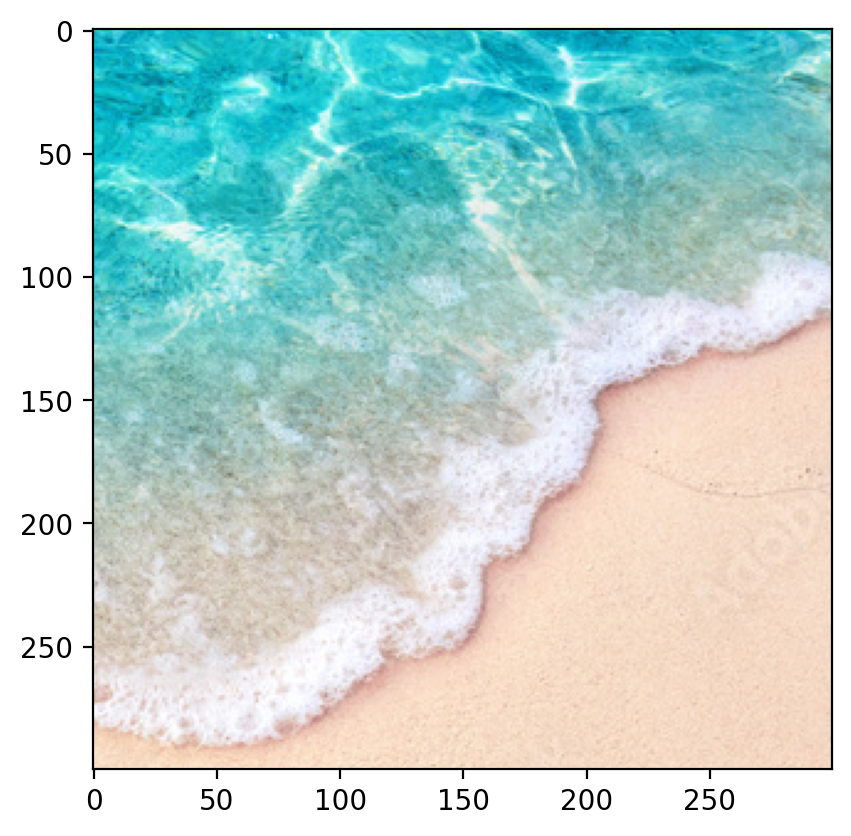

In [339]:
plt.imshow(rearrange(crop, 'c h w -> h w c').numpy())

In [347]:
print(crop.shape)
print(crop/255)
crop=crop/255

torch.Size([3, 300, 300])
tensor([[[0.1373, 0.1922, 0.2039,  ..., 0.2157, 0.3451, 0.3569],
         [0.0902, 0.1176, 0.1529,  ..., 0.2549, 0.2392, 0.2471],
         [0.1216, 0.1176, 0.1255,  ..., 0.5569, 0.4275, 0.4745],
         ...,
         [0.9490, 0.9490, 0.9843,  ..., 0.9373, 0.9725, 0.9647],
         [0.9804, 0.9922, 0.9608,  ..., 0.9451, 0.9569, 0.9529],
         [0.9804, 0.9569, 0.9686,  ..., 0.9765, 0.9686, 0.9373]],

        [[0.7333, 0.8118, 0.8196,  ..., 0.7176, 0.7882, 0.7725],
         [0.6431, 0.7137, 0.7843,  ..., 0.7608, 0.7569, 0.7490],
         [0.6549, 0.6627, 0.7020,  ..., 0.8941, 0.8353, 0.8431],
         ...,
         [0.8471, 0.8471, 0.8824,  ..., 0.8275, 0.8627, 0.8549],
         [0.8784, 0.8902, 0.8588,  ..., 0.8353, 0.8471, 0.8431],
         [0.8784, 0.8549, 0.8667,  ..., 0.8667, 0.8588, 0.8275]],

        [[0.7765, 0.8471, 0.8471,  ..., 0.7608, 0.8118, 0.7647],
         [0.7098, 0.7647, 0.8235,  ..., 0.8353, 0.8078, 0.7922],
         [0.7412, 0.7451, 0.7725

In [60]:

# plt.imshow(rearrange(masked_img, 'c h w -> h w c'))
# crop = rearrange(crop,'c h w -> c (h w)').float()
# print(crop.shape[0])
# print(crop.shape[1])
#print(crop[0])

In [349]:


# def factorize(A, k, device=torch.device("cpu")):
#     """Factorize the matrix A into W and H
#     A: input matrix of size (n_users, n_movies)
#     k: number of latent features
    
#     Returns W and H
#     W: matrix of size (n_users, k)
#     H: matrix of size (k, n_movies)
#     """
#     A = A.to(device)

#     A = rearrange(A, 'c h w -> c (h w)').float()
    
#     # Randomly initialize W and H
#     W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
#     H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
#     
    
#     # Optimizer
#     optimizer = optim.Adam([W, H], lr=0.01)
    
#     # Train the model
#     for i in range(1000):
#         # Compute the loss
#         loss = torch.norm(torch.mm(W, H) - A)
        
#         # Zero the gradients
#         optimizer.zero_grad()
        
#         # Backpropagate
#         loss.backward()
        
#         # Update the parameters
#         optimizer.step()
#     print(W)
#     print(H)
#     print(A)
#     print(torch.mm(W, H).cpu().detach().numpy())
        
#     return W, H, loss

import torch
import torch.optim as optim

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def factorize_channel(A_channel, k, device=torch.device("cpu")):
    """Factorize a single channel matrix into W and H without flattening."""
    A_channel = A_channel.to(device).float()

    # Randomly initialize W and H
    W = torch.randn(A_channel.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A_channel.shape[1], requires_grad=True, device=device)

    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A_channel)

    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A_channel
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        # Zero the gradients
        optimizer.zero_grad()

        # Backpropagate
        loss.backward()

        # Update the parameters
        optimizer.step()

    return W, H, loss

def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix A for each RGB channel, multiply W and H, and return the reconstructed image and total loss."""
    A = A.to(device)

    # Initialize list to hold reconstructed channels and total loss
    reconstructed_channels = []
    total_loss = 0

    # Factorize each channel (R, G, B) independently
    for channel in range(A.shape[0]):  # Loop through each RGB channel
        W, H, loss = factorize_channel(A[channel], k, device)

        # Multiply W and H to reconstruct the channel
        reconstructed_channel = torch.mm(W, H)
        reconstructed_channels.append(reconstructed_channel)

        # Accumulate the loss for each channel
        total_loss += loss.item()

    # Stack the reconstructed channels back into an RGB image
    reconstructed_A = torch.stack(reconstructed_channels)

    return reconstructed_A, total_loss



In [369]:
reconstructed_img,loss = factorize(crop, 50, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12735456..1.0718808].


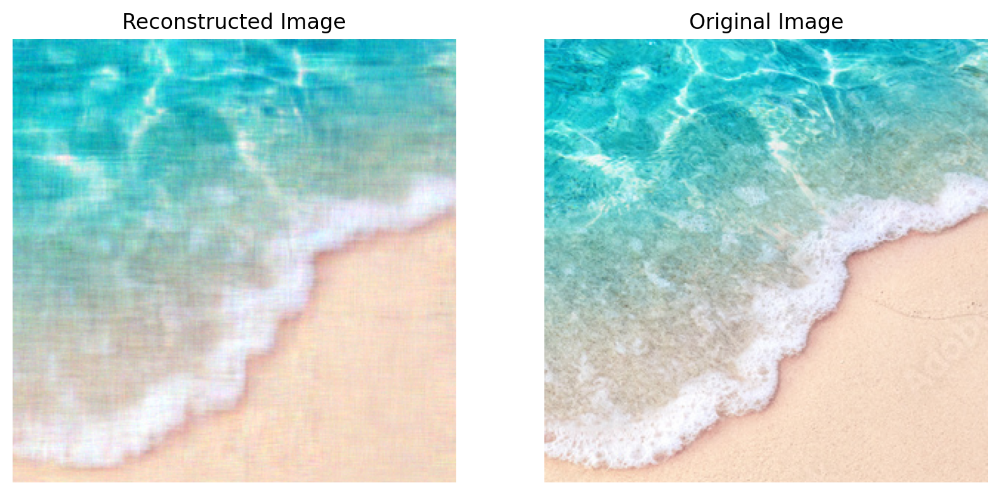

In [370]:


import matplotlib.pyplot as plt
from einops import rearrange

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Ensure that the tensor does not require gradients and move it to CPU
reconstructed_img_np = reconstructed_img.detach().cpu().numpy()
masked_img_np = crop.detach().cpu().numpy()

# Display the reconstructed image
# Reshape and rearrange the output to match original image format
reconstructed_img_np = rearrange(reconstructed_img_np, 'c h w -> h w c')
ax[0].imshow(reconstructed_img_np)
ax[0].set_title('Reconstructed Image')
ax[0].axis('off')  # Hide axes for a cleaner look

# Display the original image
masked_img_np = rearrange(masked_img_np, 'c h w -> h w c')
ax[1].imshow(masked_img_np, cmap='gray')
ax[1].set_title('Original Image')
ax[1].axis('off')

plt.show()


In [371]:
# calculating RMSE 
def calculate_rmse(original, reconstructed):
    
    if isinstance(original, torch.Tensor):
        original = original.detach().numpy()
    if isinstance(reconstructed, torch.Tensor):
        reconstructed = reconstructed.detach().numpy()
    
   
    mse = np.mean((original - reconstructed) ** 2)
    rmse = np.sqrt(mse)
    return rmse

In [372]:
print("RMSE is:",calculate_rmse(crop,reconstructed_img))


RMSE is: 0.041872352


PSNR (Peak Signal-to-Noise Ratio):
PSNR measures the ratio between the maximum possible value of a signal and the power of the noise that affects the signal. It is a common metric for assessing the quality of image reconstruction, where higher PSNR generally indicates better quality.

PSNR=10*log10(R^2 / MSE)

R is the maximum possible pixel value  (for 8 bit img R=255)
MSE:MSE is the Mean Squared Error, which is the average of the squared differences between the original and reconstructed images.

Note:higher PSNR generally indicates better quality

In [373]:
#calculating PSNR
def calculate_psnr(original, reconstructed, max_pixel=255.0):
    # Compute the RMSE
    rmse = calculate_rmse(original, reconstructed)
    
    # Compute the PSNR
    if rmse == 0:
        return float('inf')  # PSNR is infinite if there is no error
    psnr = 10 * np.log10((max_pixel ** 2) / (rmse ** 2))
    return psnr

In [374]:
print("PSNR is: ",calculate_psnr(crop,reconstructed_img))


PSNR is:  75.69225640948396


<h1 style="font-size: 1.5em; color: #555555;">Question2) Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.</h1>


In [375]:
crop = torchvision.transforms.functional.crop(img.cpu(), 0, 600, 300, 300)
crop.shapecrop = crop.to(device)
crop = crop.to(device)

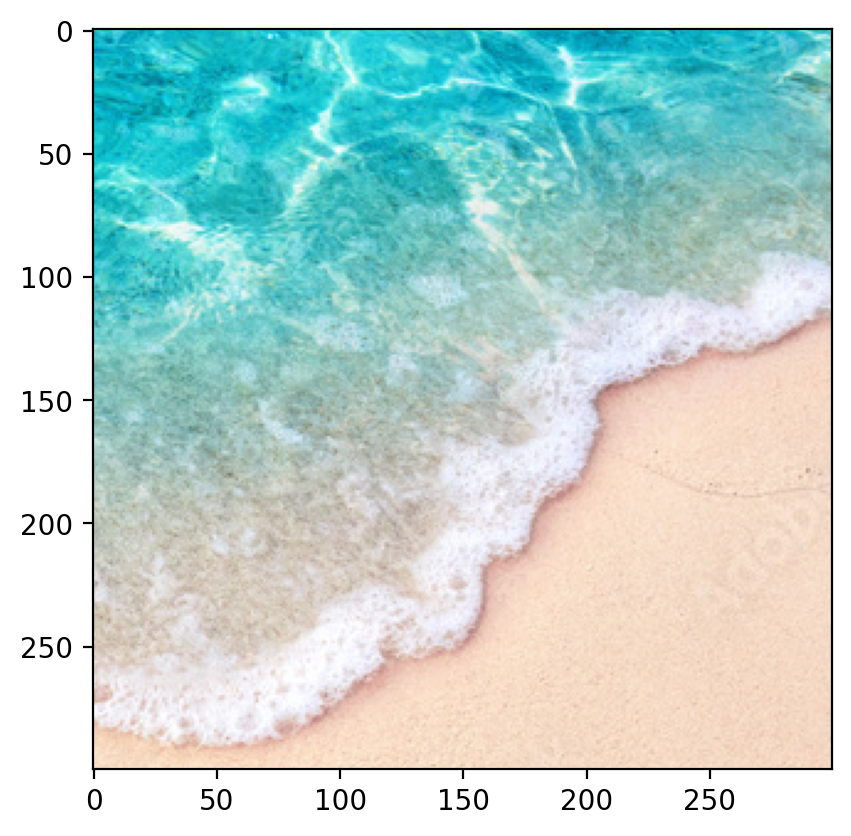

In [376]:
plt.imshow(rearrange(crop, 'c h w -> h w c').numpy())

In [377]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(crop.reshape(-1, 1))
scaler_img
print(scaler_img)

MinMaxScaler()


In [378]:
img_scaled = scaler_img.transform(crop.reshape(-1, 1)).reshape(crop.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)
print(img_scaled)

tensor([[[0.1373, 0.1922, 0.2039,  ..., 0.2157, 0.3451, 0.3569],
         [0.0902, 0.1176, 0.1529,  ..., 0.2549, 0.2392, 0.2471],
         [0.1216, 0.1176, 0.1255,  ..., 0.5569, 0.4275, 0.4745],
         ...,
         [0.9490, 0.9490, 0.9843,  ..., 0.9373, 0.9725, 0.9647],
         [0.9804, 0.9922, 0.9608,  ..., 0.9451, 0.9569, 0.9529],
         [0.9804, 0.9569, 0.9686,  ..., 0.9765, 0.9686, 0.9373]],

        [[0.7333, 0.8118, 0.8196,  ..., 0.7176, 0.7882, 0.7725],
         [0.6431, 0.7137, 0.7843,  ..., 0.7608, 0.7569, 0.7490],
         [0.6549, 0.6627, 0.7020,  ..., 0.8941, 0.8353, 0.8431],
         ...,
         [0.8471, 0.8471, 0.8824,  ..., 0.8275, 0.8627, 0.8549],
         [0.8784, 0.8902, 0.8588,  ..., 0.8353, 0.8471, 0.8431],
         [0.8784, 0.8549, 0.8667,  ..., 0.8667, 0.8588, 0.8275]],

        [[0.7765, 0.8471, 0.8471,  ..., 0.7608, 0.8118, 0.7647],
         [0.7098, 0.7647, 0.8235,  ..., 0.8353, 0.8078, 0.7922],
         [0.7412, 0.7451, 0.7725,  ..., 0.8980, 0.8471, 0.

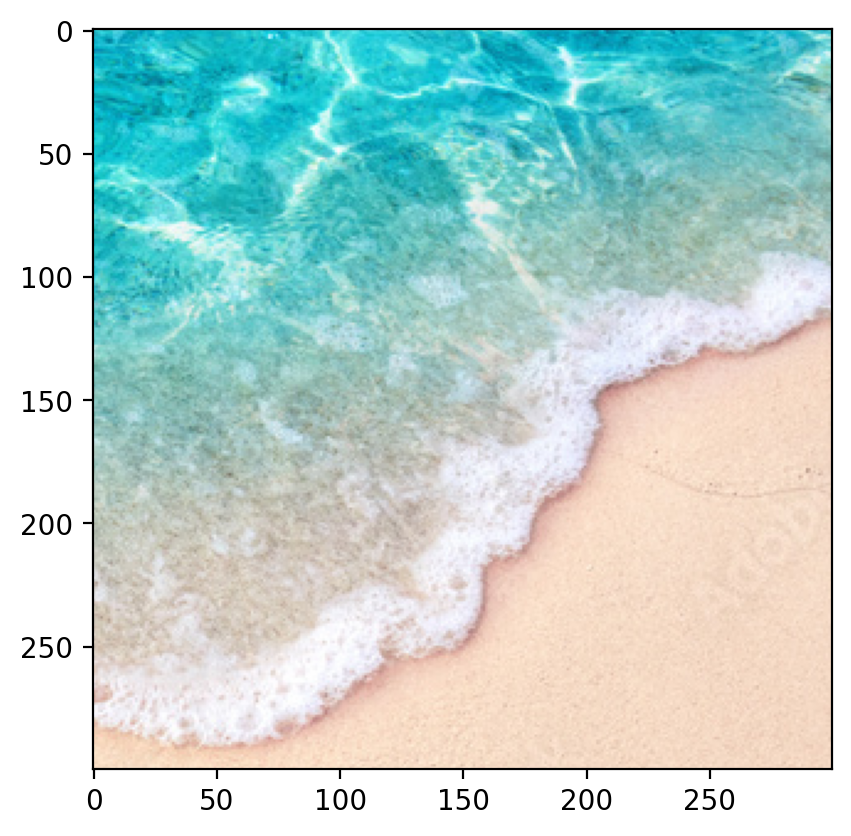

In [379]:
plt.imshow(rearrange(img_scaled, 'c h w -> h w c').numpy())

In [380]:
import random
def mask_image(img_scaled, square_size):
    img_copy = img_scaled.clone().float()  # Convert to float to handle NaNs
    
    
    c, height, width = img_copy.shape
    
    
    if square_size > min(height, width):
        raise ValueError("Square size is larger than the image dimensions.")
    
   
    top_left_x = random.randint(0, height - square_size)
    top_left_y = random.randint(0, width - square_size)
    

    img_copy[:, top_left_x:top_left_x + square_size, top_left_y:top_left_y + square_size] = float('nan')
    
    return img_copy, (top_left_x, top_left_y, square_size)

In [385]:
 masked_img,square_info = mask_image(img_scaled, 30)
print(square_info)

(55, 8, 30)


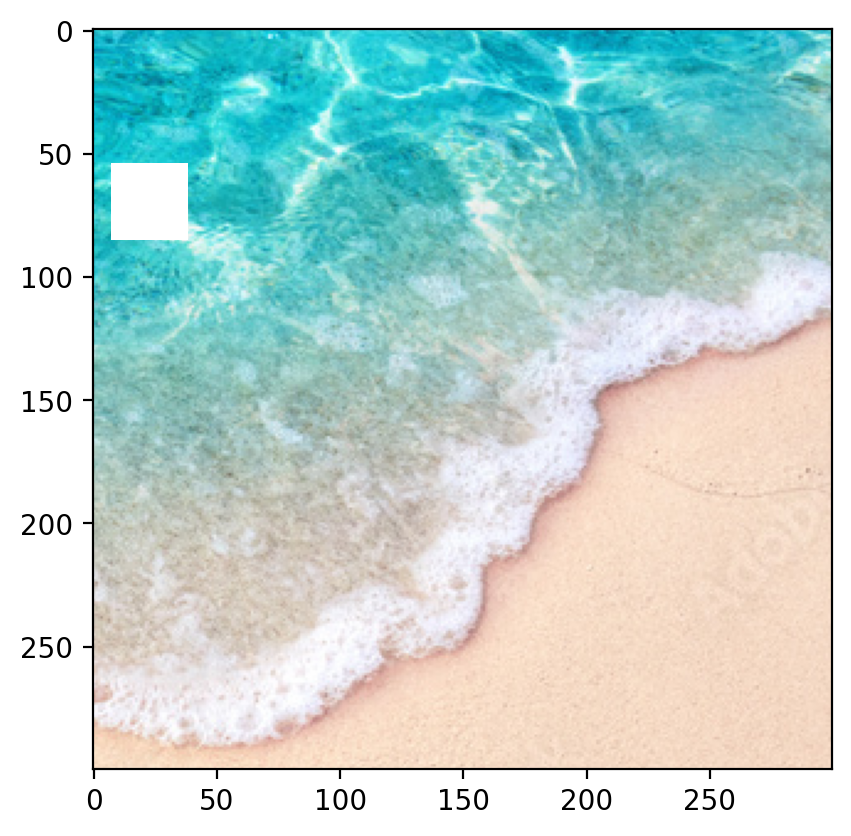

In [386]:
plt.imshow(rearrange(masked_img, 'c h w -> h w c').numpy())

In [400]:

reconstructed_img,loss = factorize(masked_img, 50, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.107717864..1.082917].


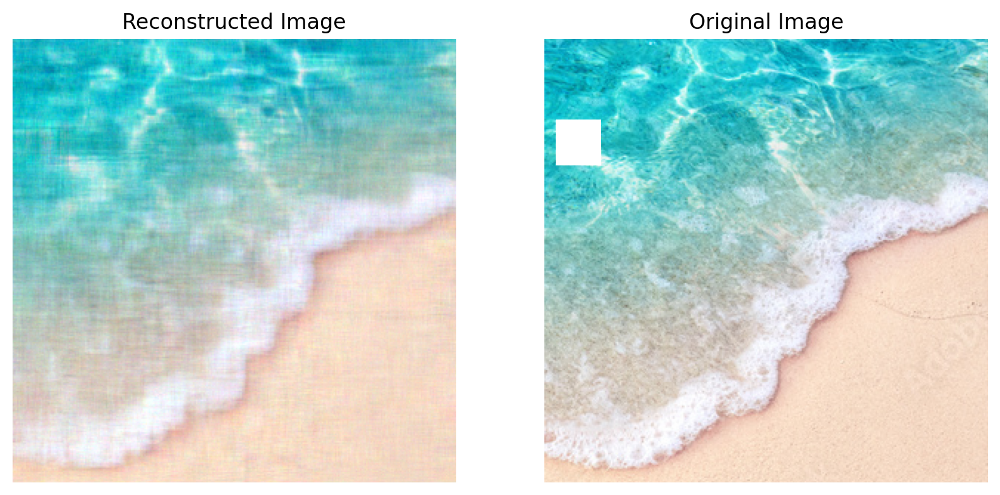

In [401]:
import matplotlib.pyplot as plt
from einops import rearrange

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Convert tensors to numpy arrays after detaching and moving to CPU
reconstructed_img_np = reconstructed_img.detach().cpu().numpy()
masked_img_np = masked_img.detach().cpu().numpy()

# Reshape and rearrange the output to match original image format for visualization
reconstructed_img_np = rearrange(reconstructed_img_np, 'c h w -> h w c')
masked_img_np = rearrange(masked_img_np, 'c h w -> h w c')

# Display the reconstructed image
ax[0].imshow(reconstructed_img_np)
ax[0].set_title('Reconstructed Image')
ax[0].axis('off')  # Hide axes for a cleaner look

# Display the original image
ax[1].imshow(masked_img_np, cmap='gray')
ax[1].set_title('Original Image')
ax[1].axis('off')

plt.show()


In [396]:

import numpy as np
import torch

def calculate_rmse(original, reconstructed):
    if isinstance(original, torch.Tensor):
        original = original.detach().numpy()
    if isinstance(reconstructed, torch.Tensor):
        reconstructed = reconstructed.detach().numpy()
    
    # Handle NaN values
    valid_mask = np.isfinite(original) & np.isfinite(reconstructed)
    
    # Apply the mask to filter out NaN values
    original = original[valid_mask]
    reconstructed = reconstructed[valid_mask]
    
    # Check if there are any valid values left
    if original.size == 0:
        raise ValueError("No valid data points left after removing NaN values")
    
    mse = np.mean((original - reconstructed) ** 2)
    rmse = np.sqrt(mse)
    return rmse


In [402]:
print("RMSE is:",calculate_rmse(masked_img,reconstructed_img))

RMSE is: 0.040994078


In [403]:
#calculating PSNR
def calculate_psnr(original, reconstructed, max_pixel=255.0):
    # Compute the RMSE
    rmse = calculate_rmse(original, reconstructed)
    
    # Compute the PSNR
    if rmse == 0:
        return float('inf')  # PSNR is infinite if there is no error
    psnr = 10 * np.log10((max_pixel ** 2) / (rmse ** 2))
    return psnr

In [404]:
print("PSNR is: ",calculate_psnr(masked_img,reconstructed_img))

PSNR is:  75.8763811630806


In [405]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [406]:
beach_X, beach_Y = create_coordinate_map(masked_img)

print(beach_X.shape, beach_Y.shape)

print(beach_X)
print(beach_Y)

torch.Size([90000, 2]) torch.Size([90000, 3])
tensor([[  0.,   0.],
        [  0.,   1.],
        [  0.,   2.],
        ...,
        [299., 297.],
        [299., 298.],
        [299., 299.]])
tensor([[0.1373, 0.7333, 0.7765],
        [0.1922, 0.8118, 0.8471],
        [0.2039, 0.8196, 0.8471],
        ...,
        [0.9765, 0.8667, 0.7843],
        [0.9686, 0.8588, 0.7765],
        [0.9373, 0.8275, 0.7451]])


In [407]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(beach_X.cpu())

# Scale the X coordinates
beach_X_scaled = scaler_X.transform(beach_X.cpu())

# Move the scaled X coordinates to the GPU
beach_X_scaled = torch.tensor(beach_X_scaled).to(device)

# Set to dtype float32
beach_X_scaled = beach_X_scaled.float()

print(beach_X_scaled.shape)
print(beach_X_scaled)

torch.Size([90000, 2])
tensor([[-1.0000, -1.0000],
        [-1.0000, -0.9933],
        [-1.0000, -0.9866],
        ...,
        [ 1.0000,  0.9866],
        [ 1.0000,  0.9933],
        [ 1.0000,  1.0000]])


In [408]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)

In [409]:

import torch
import torch.nn as nn


def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    
    criterion = nn.MSELoss(reduction='none')  # Use 'none' to get the loss per sample
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    
    # Mask NaN values in Y
    mask = ~torch.isnan(Y).any(dim=1)  # Create a mask to exclude samples with NaN in Y
    if mask.sum() == 0:
        print("All target values are NaN.")
        return
    
    X_clean = X[mask]  # Only include rows where Y is not NaN
    Y_clean = Y[mask]  # Only include rows where Y is not NaN
    
    for epoch in range(epochs):
        optimizer.zero_grad()
        
        # Forward pass
        outputs = net(X_clean)
        
        # Compute the loss
        loss_per_sample = criterion(outputs, Y_clean)
        
        # Apply mask to loss (though in this case all loss should be valid)
        loss = loss_per_sample.mean()
        
        # Check for NaN in loss
        if torch.isnan(loss):
            print("Encountered NaN in loss value.")
            break
        
        # Backward pass
        loss.backward()
        
        # Check for NaN in gradients
        for param in net.parameters():
            if torch.isnan(param.grad).any():
                print("Encountered NaN in gradients.")
                return
        
        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(net.parameters(), max_norm=1.0)
        
        optimizer.step()
        
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    
    return loss.item()



In [410]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)


In [426]:
X_rff = create_rff_features(beach_X_scaled, 3000, 0.008)

In [427]:
print(X_rff.shape)
print(X_rff)
output=crop

torch.Size([90000, 3000])
tensor([[-2.5530e-02, -2.3429e-02, -2.5200e-02,  ..., -4.0357e-03,
         -9.8199e-03, -1.6365e-03],
        [-2.5817e-02, -2.2487e-02, -2.5027e-02,  ...,  2.2437e-02,
         -1.0566e-02, -2.5186e-02],
        [-2.5399e-02, -2.1400e-02, -1.9468e-02,  ...,  1.9875e-02,
         -1.1302e-02, -1.2548e-02],
        ...,
        [ 4.3188e-03,  7.8212e-03,  1.8847e-02,  ...,  3.8843e-03,
         -2.3519e-03, -2.2162e-02],
        [ 6.8841e-05,  9.7634e-03,  8.8551e-03,  ..., -2.2512e-02,
         -3.1596e-03, -1.8953e-02],
        [-4.1834e-03,  1.1643e-02, -3.0423e-03,  ..., -1.9776e-02,
         -3.9642e-03,  1.1488e-02]])


In [428]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, beach_Y, 2500)

Epoch 0 loss: 0.614882
Epoch 100 loss: 0.138045
Epoch 200 loss: 0.039718
Epoch 300 loss: 0.028619
Epoch 400 loss: 0.027047
Epoch 500 loss: 0.026196
Epoch 600 loss: 0.025503
Epoch 700 loss: 0.024911
Epoch 800 loss: 0.024399
Epoch 900 loss: 0.023954
Epoch 1000 loss: 0.023566
Epoch 1100 loss: 0.023226
Epoch 1200 loss: 0.022926
Epoch 1300 loss: 0.022658
Epoch 1400 loss: 0.022418
Epoch 1500 loss: 0.022200
Epoch 1600 loss: 0.022002
Epoch 1700 loss: 0.021820
Epoch 1800 loss: 0.021654
Epoch 1900 loss: 0.021502
Epoch 2000 loss: 0.021363
Epoch 2100 loss: 0.021237
Epoch 2200 loss: 0.021124
Epoch 2300 loss: 0.021022
Epoch 2400 loss: 0.020930


0.020850319415330887

In [429]:


def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Returns the predicted (reconstructed) image tensor.
    """
    num_channels, height, width = original_img.shape
    net.eval()
    
    # Generate the reconstructed image with no gradient calculation
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)

    # Plotting the images
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")
    
    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")
    
    for a in [ax0, ax1]:
        a.axis("off")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()
    
    # Return the reconstructed image (outputs)
    return outputs


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16812533..1.1067479].


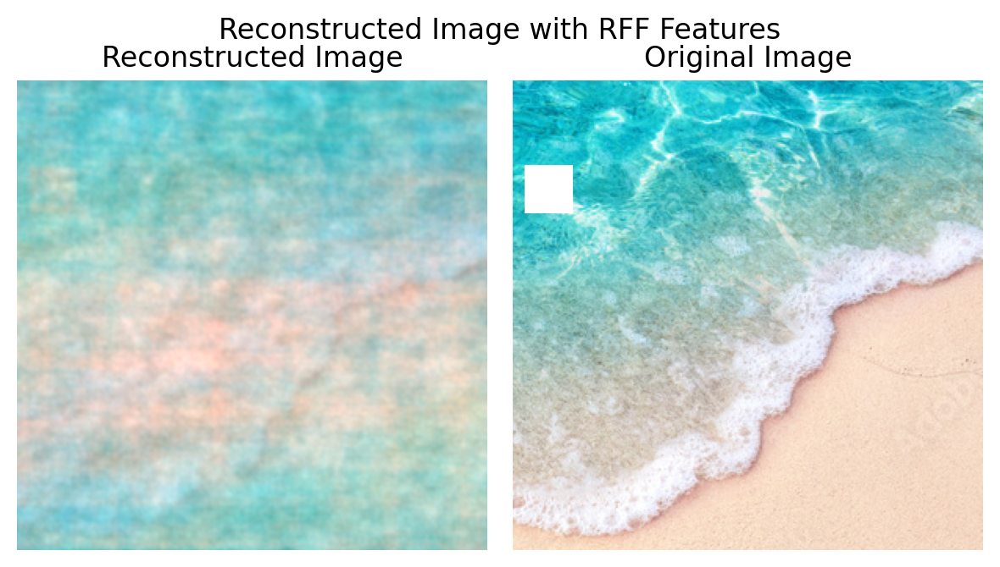

In [430]:
output=plot_reconstructed_and_original_image(masked_img, net, X_rff, title="Reconstructed Image with RFF Features")

In [431]:
output =output.permute(2, 0, 1)

In [432]:
print("reconstructed:",output.shape)
print("reconstructed:",output)
print("masked_img:",masked_img.shape)
print("masked_img:",masked_img)



reconstructed: torch.Size([3, 300, 300])
reconstructed: tensor([[[0.4228, 0.4167, 0.4061,  ..., 0.4136, 0.3913, 0.3791],
         [0.4274, 0.4139, 0.4025,  ..., 0.4498, 0.4169, 0.4099],
         [0.4435, 0.4245, 0.4156,  ..., 0.4914, 0.4580, 0.4563],
         ...,
         [0.5213, 0.5565, 0.5617,  ..., 0.6465, 0.6374, 0.6116],
         [0.5021, 0.5375, 0.5444,  ..., 0.6589, 0.6431, 0.6181],
         [0.4689, 0.4927, 0.4969,  ..., 0.6472, 0.6235, 0.6008]],

        [[0.7200, 0.7321, 0.7358,  ..., 0.7639, 0.7535, 0.7433],
         [0.7332, 0.7404, 0.7408,  ..., 0.7820, 0.7647, 0.7595],
         [0.7352, 0.7362, 0.7352,  ..., 0.7956, 0.7819, 0.7806],
         ...,
         [0.7646, 0.7633, 0.7606,  ..., 0.7624, 0.7693, 0.7761],
         [0.7530, 0.7539, 0.7532,  ..., 0.7772, 0.7792, 0.7832],
         [0.7440, 0.7409, 0.7345,  ..., 0.7781, 0.7775, 0.7856]],

        [[0.7390, 0.7532, 0.7563,  ..., 0.7756, 0.7602, 0.7430],
         [0.7567, 0.7653, 0.7622,  ..., 0.7936, 0.7737, 0.7664],
  

In [433]:
print("rmse:",calculate_rmse(masked_img,output))

rmse: 0.14439377


In [434]:
print("PSNR is: ",calculate_psnr(masked_img,output))

PSNR is:  64.93983438299799
